<a href="https://colab.research.google.com/github/MayerT1/PIPECAST/blob/main/Pipecast_Enhanced_AOI_Layer_Gen.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [15]:
from google.colab import drive
drive.mount('/content/drive')

ValueError: Mountpoint must not already contain files

# Census Data

Jonathan Schroeder, David Van Riper, Steven Manson, Katherine Knowles, Tracy Kugler, Finn Roberts, and Steven Ruggles. IPUMS National Historical Geographic Information System: Version 20.0 [dataset]. Minneapolis, MN: IPUMS. 2025. http://doi.org/10.18128/D050.V20.0

https://www.ipums.org/

Approach to clip with Census with GDAL

Works great just commented off

In [ ]:
# # Install GDAL
# !apt-get install -y gdal-bin python3-gdal

In [ ]:
# # Create output folder
# !mkdir -p /content/nhgis_shape

# # Run GDAL to extract only Texas block groups
# !ogr2ogr \
#   -where "STATEFP = '48'" \
#   /content/nhgis_shape/texas_block_groups.shp \
#   /vsizip//content/drive/Shareddrives/SCO-Shared/Science\ Resources/Thematic\ Service\ Areas/WaterSecurity/Pipecast/NHGIS_Census_Tracts/nhgis0003_shape.zip/nhgis0003_shape/nhgis0003_shapefile_tl2020_us_blck_grp_2020.zip/US_blck_grp_2020.shp


In [ ]:
# import geopandas as gpd
# import folium

# # Load the clipped Texas shapefile
# gdf_tx = gpd.read_file('/content/nhgis_shape/texas_block_groups.shp')

# # Optional: simplify geometry for faster rendering
# gdf_tx = gdf_tx.to_crs(epsg=4326).simplify(0.001, preserve_topology=True)

# # Create Folium map centered on Texas
# centroid = gdf_tx.geometry.unary_union.centroid
# m = folium.Map(location=[centroid.y, centroid.x], zoom_start=6)

# # Add polygons to the map
# folium.GeoJson(gdf_tx).add_to(m)

# m

In [10]:
# import shutil

# # Source folder where the clipped Texas shapefile was saved
# src_folder = '/content/nhgis_shape'

# # Destination folder in your Google Drive
# dst_folder = '/content/drive/Shareddrives/SCO-Shared/Science Resources/Thematic Service Areas/WaterSecurity/Pipecast/NHGIS_Census_Tracts'

# # List of shapefile component extensions to copy
# shapefile_base = 'texas_block_groups'
# extensions = ['.shp', '.shx', '.dbf', '.prj', '.cpg']

# for ext in extensions:
#     src_file = f"{src_folder}/{shapefile_base}{ext}"
#     dst_file = f"{dst_folder}/{shapefile_base}{ext}"
#     try:
#         shutil.copy(src_file, dst_file)
#         print(f"Copied {src_file} → {dst_file}")
#     except FileNotFoundError:
#         print(f"Skipping missing file: {src_file}")

# print("✅ Texas block group shapefile saved to Google Drive")


Copied /content/nhgis_shape/texas_block_groups.shp → /content/drive/Shareddrives/SCO-Shared/Science Resources/Thematic Service Areas/WaterSecurity/Pipecast/NHGIS_Census_Tracts/texas_block_groups.shp
Copied /content/nhgis_shape/texas_block_groups.shx → /content/drive/Shareddrives/SCO-Shared/Science Resources/Thematic Service Areas/WaterSecurity/Pipecast/NHGIS_Census_Tracts/texas_block_groups.shx
Copied /content/nhgis_shape/texas_block_groups.dbf → /content/drive/Shareddrives/SCO-Shared/Science Resources/Thematic Service Areas/WaterSecurity/Pipecast/NHGIS_Census_Tracts/texas_block_groups.dbf
Copied /content/nhgis_shape/texas_block_groups.prj → /content/drive/Shareddrives/SCO-Shared/Science Resources/Thematic Service Areas/WaterSecurity/Pipecast/NHGIS_Census_Tracts/texas_block_groups.prj
Copied /content/nhgis_shape/texas_block_groups.cpg → /content/drive/Shareddrives/SCO-Shared/Science Resources/Thematic Service Areas/WaterSecurity/Pipecast/NHGIS_Census_Tracts/texas_block_groups.cpg
✅ Tex

In [12]:
import geopandas as gpd
import folium

# Path to the saved Texas shapefile in your Drive
shp_path = '/content/drive/Shareddrives/SCO-Shared/Science Resources/Thematic Service Areas/WaterSecurity/Pipecast/NHGIS_Census_Tracts/texas_block_groups.shp'

# Load the shapefile
gdf_tx = gpd.read_file(shp_path)

# Optional: simplify geometry for faster rendering
gdf_tx_census = gdf_tx.to_crs(epsg=4326).simplify(0.001, preserve_topology=True)

# Create Folium map centered on Texas
centroid = gdf_tx_census.geometry.unary_union.centroid
m = folium.Map(location=[centroid.y, centroid.x], zoom_start=6)

# Add polygons
folium.GeoJson(
    gdf_tx_census,
    name="Texas Block Groups"
).add_to(m)

folium.LayerControl().add_to(m)
m


/tmp/ipython-input-2684041915.py:14: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  centroid = gdf_tx_census.geometry.unary_union.centroid


# Watersheds

In [11]:
import zipfile
import geopandas as gpd
import folium
from pathlib import Path
import pandas as pd

# Path to your zip file
zip_path = Path("/content/drive/Shareddrives/SCO-Shared/Science Resources/Thematic Service Areas/WaterSecurity/Pipecast/USGS_High_Res_Watersheds/WBD_National_GPKG.zip")
extract_dir = zip_path.parent / "unzipped_wbd"

# 1. Unzip the file
if not extract_dir.exists():
    extract_dir.mkdir(parents=True, exist_ok=True)
    with zipfile.ZipFile(zip_path, 'r') as zf:
        zf.extractall(extract_dir)

# 2. Find the GeoPackage file inside
gpkg_files = list(extract_dir.glob("*.gpkg"))
if not gpkg_files:
    raise FileNotFoundError("No .gpkg file found in extracted contents.")
gpkg_path = gpkg_files[0]

# 3. Load a specific layer (choose from the list you saw in the warning)
layer_name = "WBDHU8"  # can be WBDHU2, WBDHU4, WBDHU6, etc.
gdf = gpd.read_file(gpkg_path, layer=layer_name)

# 4. Convert datetime columns to strings for Folium compatibility
for col in gdf.columns:
    if pd.api.types.is_datetime64_any_dtype(gdf[col]):
        gdf[col] = gdf[col].astype(str)

# 5. Create a Folium map
m = folium.Map(location=[39.8283, -98.5795], zoom_start=4, tiles="CartoDB positron")

# 6. Add the watershed polygons
folium.GeoJson(
    gdf,
    name=f"US Watersheds - {layer_name}",
    style_function=lambda x: {
        "fillColor": "blue",
        "color": "black",
        "weight": 0.5,
        "fillOpacity": 0.2,
    }
).add_to(m)

folium.LayerControl().add_to(m)

# 7. Display in notebook
m


In [12]:
import geopandas as gpd
import pandas as pd

gpkg_path = "/content/drive/Shareddrives/SCO-Shared/Science Resources/Thematic Service Areas/WaterSecurity/Pipecast/USGS_High_Res_Watersheds/unzipped_wbd/WBD_National_GPKG.gpkg"

# Bounding box example for Colorado (minx, miny, maxx, maxy)
bbox = (-109.05, 36.99, -102.04, 41.00)

# Load only HUC16 for Colorado area
gdf = gpd.read_file(gpkg_path, layer="WBDHU12", bbox=bbox)

# Convert datetime columns
for col in gdf.columns:
    if pd.api.types.is_datetime64_any_dtype(gdf[col]):
        gdf[col] = gdf[col].astype(str)

print(gdf.head())


DataSourceError: /content/drive/Shareddrives/SCO-Shared/Science Resources/Thematic Service Areas/WaterSecurity/Pipecast/USGS_High_Res_Watersheds/unzipped_wbd/WBD_National_GPKG.gpkg: No such file or directory

In [8]:
import zipfile
import geopandas as gpd
import pandas as pd
import folium
from pathlib import Path

# 1. Unzip
zip_path = Path("/content/drive/Shareddrives/SCO-Shared/Science Resources/Thematic Service Areas/WaterSecurity/Pipecast/USGS_High_Res_Watersheds/WBD_National_GPKG.zip")
extract_dir = zip_path.parent / "unzipped_wbd"

if not extract_dir.exists():
    extract_dir.mkdir(parents=True, exist_ok=True)
    with zipfile.ZipFile(zip_path, 'r') as zf:
        zf.extractall(extract_dir)

# 2. Load WBDHU12
gpkg_path = list(extract_dir.glob("*.gpkg"))[0]
gdf = gpd.read_file(gpkg_path, layer="WBDHU12")

# 3. Filter to Texas only (ignore NaNs)
gdf_tx = gdf[gdf["states"].str.contains("TX", na=False)].copy()

# (Optional) simplify to speed up display
gdf_tx["geometry"] = gdf_tx.geometry.simplify(tolerance=0.001, preserve_topology=True)

# 4. Convert datetime columns
for col in gdf_tx.columns:
    if pd.api.types.is_datetime64_any_dtype(gdf_tx[col]):
        gdf_tx[col] = gdf_tx[col].astype(str)

# 5. Map
m = folium.Map(location=[31, -99], zoom_start=6, tiles="CartoDB positron")
folium.GeoJson(
    gdf_tx,
    name="WBDHU12 - Texas",
    style_function=lambda x: {
        "fillColor": "blue",
        "color": "black",
        "weight": 0.5,
        "fillOpacity": 0.2,
    },
    tooltip=folium.GeoJsonTooltip(fields=["huc12", "name", "states"])
).add_to(m)

folium.LayerControl().add_to(m)

m


FileNotFoundError: [Errno 2] No such file or directory: '/content/drive/Shareddrives/SCO-Shared/Science Resources/Thematic Service Areas/WaterSecurity/Pipecast/USGS_High_Res_Watersheds/WBD_National_GPKG.zip'

# Open FEMA Products

In [ ]:
# # Install dependencies
# !pip install geopandas folium pyarrow

In [ ]:
# import geopandas as gpd
# import pandas as pd
# import folium

# # Your existing paths
# claims_fp = "/content/drive/Shareddrives/SCO-Shared/Science Resources/Thematic Service Areas/WaterSecurity/Pipecast/FimaNfipClaims/FimaNfipClaims.parquet"
# policies_fp = "/content/drive/Shareddrives/SCO-Shared/Science Resources/Thematic Service Areas/WaterSecurity/Pipecast/FimaNfipClaims/FimaNfipPolicies.parquet"


# # Load claims and policies as pandas DataFrames
# claims_df = pd.read_parquet(claims_fp)
# policies_df = pd.read_parquet(policies_fp)

# # Sample to 5000 points max (adjust number as needed)
# claims_sample = claims_clip.sample(min(len(claims_clip), 5000), random_state=42)
# policies_sample = policies_clip.sample(min(len(policies_clip), 5000), random_state=42)


# # Assuming your lon/lat columns are named like 'longitude' and 'latitude'
# # Adjust column names if different

# claims = gpd.GeoDataFrame(
#     claims_df,
#     geometry=gpd.points_from_xy(claims_df.longitude, claims_df.latitude),
#     crs="EPSG:4326"
# )

# policies = gpd.GeoDataFrame(
#     policies_df,
#     geometry=gpd.points_from_xy(policies_df.longitude, policies_df.latitude),
#     crs="EPSG:4326"
# )


# # Load claims and policies
# claims = gpd.read_parquet(claims_fp)
# policies = gpd.read_parquet(policies_fp)

# # Ensure geometry column exists, if not create from lon/lat (adjust these field names as needed)
# if 'geometry' not in claims.columns:
#     claims = gpd.GeoDataFrame(
#         claims, geometry=gpd.points_from_xy(claims.longitude, claims.latitude), crs="EPSG:4326"
#     )
# if 'geometry' not in policies.columns:
#     policies = gpd.GeoDataFrame(
#         policies, geometry=gpd.points_from_xy(policies.longitude, policies.latitude), crs="EPSG:4326"
#     )

# # Use your Texas WBD bounds from gdf_tx
# minx, miny, maxx, maxy = gdf_tx.total_bounds

# # Create a bounding box polygon from these bounds for clipping
# from shapely.geometry import box
# bbox = box(minx, miny, maxx, maxy)

# # Clip claims and policies to this bounding box (optional: you can also clip to actual gdf_tx polygons for tighter clipping)
# claims_clip = claims[claims.geometry.within(bbox)].copy()
# policies_clip = policies[policies.geometry.within(bbox)].copy()

# # Create folium map centered on Texas watersheds
# center = [31, -99]
# m = folium.Map(location=center, zoom_start=6, tiles="CartoDB positron")

# # Add your Texas watershed layer
# folium.GeoJson(
#     gdf_tx,
#     name="WBDHU12 - Texas",
#     style_function=lambda x: {
#         "fillColor": "blue",
#         "color": "black",
#         "weight": 0.5,
#         "fillOpacity": 0.2,
#     },
#     tooltip=folium.GeoJsonTooltip(fields=["huc12", "name", "states"])
# ).add_to(m)

# # Add clipped claims points (red)
# for _, row in claims_clip.iterrows():
#     folium.CircleMarker(
#         location=[row.geometry.y, row.geometry.x],
#         radius=3,
#         color="red",
#         fill=True,
#         fill_opacity=0.7,
#         popup=f"Claim ID: {row.get('claim_id', 'N/A')}"
#     ).add_to(m)

# # Add clipped policies points (blue)
# for _, row in policies_clip.iterrows():
#     folium.CircleMarker(
#         location=[row.geometry.y, row.geometry.x],
#         radius=3,
#         color="blue",
#         fill=True,
#         fill_opacity=0.5,
#         popup=f"Policy ID: {row.get('policy_id', 'N/A')}"
#     ).add_to(m)

# # Add layer control
# folium.LayerControl().add_to(m)

# m


# HRR

In [1]:
# ✅ Install Herbie
!pip install herbie-data --quiet

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 55.5/55.5 kB 2.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 113.5/113.5 kB 4.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 48.9/48.9 kB 2.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.4/44.4 kB 2.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 20.5/20.5 MB 42.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 45.2/45.2 MB 11.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.3/13.3 MB 30.3 MB/s eta 0:00:00


In [2]:
!pip install cfgrib xarray netcdf4 cartopy --quiet

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.3/9.3 MB 31.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.8/11.8 MB 57.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 31.9 MB/s eta 0:00:00


In [3]:
# ✅ Block 2: Import and configure
from herbie import Herbie
import xarray as xr
import matplotlib.pyplot as plt
import cartopy.crs as ccrs


 ╭─▌▌Herbie─────────────────────────────────────────────╮
 │ INFO: Created a default config file.                 │
 │ You may view/edit Herbie's configuration here:       │
 │          /root/.config/herbie/config.toml            │
 ╰──────────────────────────────────────────────────────╯



✅ Found ┊ model=hrrr ┊ product=sfc ┊ 2025-Jul-08 16:00 UTC F06 ┊ GRIB2 @ aws ┊ IDX @ aws
👨🏻‍🏭 Created directory: [/root/data/hrrr/20250708]


/usr/local/lib/python3.11/dist-packages/cartopy/io/__init__.py:242: DownloadWarning: Downloading: https://naturalearth.s3.amazonaws.com/110m_physical/ne_110m_coastline.zip
  warnings.warn(f'Downloading: {url}', DownloadWarning)


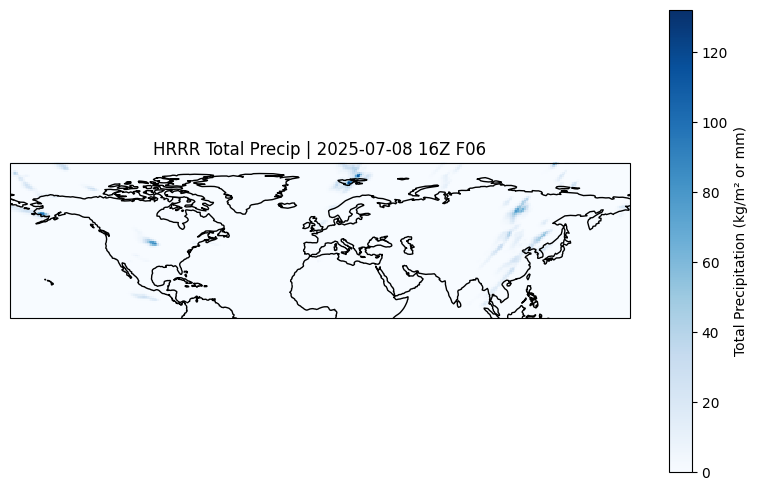

In [4]:

# Choose a date, time, and forecast hour
from datetime import datetime
date = "2025-07-08 16:00"
fxx = 6  # Forecast hour (adjust as needed)

# ✅ Block 3: Load HRRR forecast
H = Herbie(
    date,
    model="hrrr",
    product="sfc",
    fxx=fxx,
    save_dir="/root/data",
    verbose=True,
)

# ✅ Block 4: Load dataset using known variable name
# Download and open as xarray Dataset
ds = H.xarray("APCP:surface")  # Will automatically fallback to entire file if needed

# ✅ OR directly open from downloaded GRIB2 file (if index fails)
# H.download()
# ds = xr.open_dataset(H.local_grib, engine="cfgrib")

# ✅ Block 5: Access and plot precipitation field
precip = ds["tp"]  # Total Precipitation

plt.figure(figsize=(10, 6))
ax = plt.axes(projection=ccrs.PlateCarree())

precip.plot(
    ax=ax,
    transform=ccrs.PlateCarree(),
    cmap="Blues",
    cbar_kwargs={"label": "Total Precipitation (kg/m² or mm)"}
)

ax.coastlines()
ax.set_title(f"HRRR Total Precip | {H.date:%Y-%m-%d %HZ} F{H.fxx:02d}")
plt.show()


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 22.2/22.2 MB 23.6 MB/s eta 0:00:00


/tmp/ipython-input-343658019.py:26: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  ds.dims["x"], ds.dims["y"]


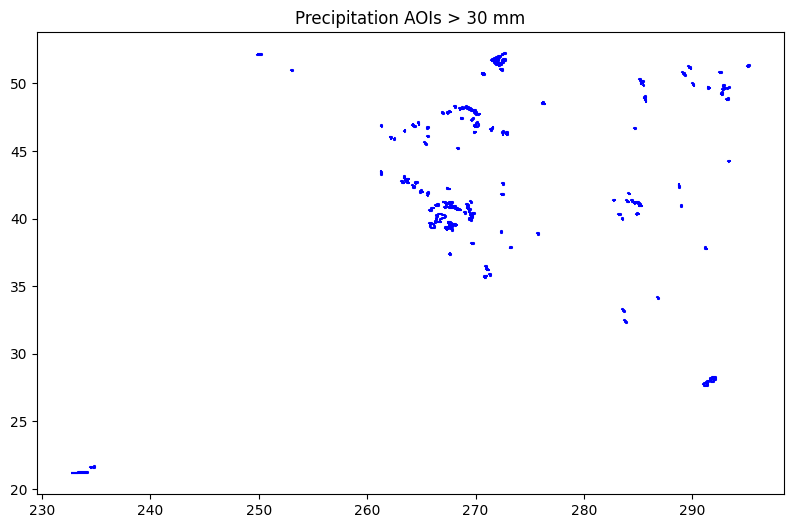

In [5]:
# Block 1: Install necessary geospatial tools
!pip install geopandas shapely rasterio scipy pyproj --quiet

# Block 2: Import libraries
import numpy as np
import geopandas as gpd
from shapely.geometry import shape, Polygon, mapping
import matplotlib.pyplot as plt
from scipy.ndimage import label
import rasterio.features
import xarray as xr

# Block 3: Define threshold and extract data
threshold_mm = 30  # e.g., 10 mm total precipitation
precip = ds["tp"]  # Already loaded from Herbie (xarray dataset)
precip_data = precip.values

# Create binary mask and label connected regions
mask = precip_data > threshold_mm
labeled, num_features = label(mask)

# Get affine transform for geolocation
transform = rasterio.transform.from_bounds(
    float(ds.longitude.min()), float(ds.latitude.min()),
    float(ds.longitude.max()), float(ds.latitude.max()),
    ds.dims["x"], ds.dims["y"]
)

# Convert labeled mask to polygons
shapes = rasterio.features.shapes(
    labeled.astype(np.int16),
    mask=mask,
    transform=transform
)

# Create GeoDataFrame with metadata
polygons = []
ids = []
means = []
times = []

for geom, label_id in shapes:
    if label_id == 0:
        continue
    poly = shape(geom)
    if poly.area > 0.01:  # Optional area filter
        # Get mask for this AOI
        aoi_mask = labeled == label_id
        mean_precip = float(precip_data[aoi_mask].mean())

        polygons.append(poly)
        ids.append(int(label_id))
        means.append(mean_precip)
        times.append(str(ds.valid_time.values))  # use forecast valid time

# Build GeoDataFrame with attributes
gdf = gpd.GeoDataFrame({
    'id': ids,
    'mean_precip_mm': means,
    'forecast_time': times
}, geometry=polygons, crs="EPSG:4326")

# Save to GeoJSON if needed
gdf.to_file("precip_aois.geojson", driver="GeoJSON")

# Block 4: Plot
gdf.boundary.plot(edgecolor='blue', figsize=(10, 6))
plt.title(f"Precipitation AOIs > {threshold_mm} mm")
plt.show()


In [6]:
gdf

,id,mean_precip_mm,forecast_time,geometry
0,4,57.880348,2025-07-08T22:00:00.000000000,"POLYGON ((249.86339 52.19952, 249.86339 52.169..."
1,3,52.174999,2025-07-08T22:00:00.000000000,"POLYGON ((272.60195 52.22924, 272.60195 52.199..."
2,11,44.220409,2025-07-08T22:00:00.000000000,"POLYGON ((272.64263 51.84283, 272.64263 51.813..."
3,9,49.749672,2025-07-08T22:00:00.000000000,"POLYGON ((272.07314 52.02118, 272.07314 51.961..."
4,15,45.934074,2025-07-08T22:00:00.000000000,"POLYGON ((272.19518 51.48615, 272.19518 51.456..."
...,...,...,...,...
104,422,48.195999,2025-07-08T22:00:00.000000000,"POLYGON ((291.80159 28.27184, 291.80159 28.242..."
105,423,42.447533,2025-07-08T22:00:00.000000000,"POLYGON ((291.39482 28.00433, 291.39482 27.974..."
106,434,33.962219,2025-07-08T22:00:00.000000000,"POLYGON ((234.77215 21.67315, 234.77215 21.643..."
107,435,35.078182,2025-07-08T22:00:00.000000000,"POLYGON ((234.44673 21.64343, 234.44673 21.613..."


# Making the Enhanced AOIS (megre forecast threshold and biophysical and socio data)



In [7]:
# Pick a common CRS (WGS84 for mapping or projected CRS for area calcs)
target_crs = "EPSG:4326"

forecast_aoi = gdf.to_crs(target_crs)
gdf_tx_census = gdf_tx_census.to_crs(target_crs)
gdf_tx = gdf_tx.to_crs(target_crs)


NameError: name 'gdf_tx_census' is not defined